In [1]:
# Import necessary libraries
import pandas as pd
import plotly.graph_objects as go
import geopandas as gpd


In [2]:
# Load and prepare data

# Read airports data
airport = pd.read_csv("airports.csv", header=None)
airport.columns = ["Airport_ID", "Ident", "Type", "Airport_Name", "Latitude", "Longitude", "Elevation_Ft", "Continent", "ISO_Country", "ISO_Region", "Municipality", "Scheduled_Service", "GPS_Code", "IATA", "Local_Code", "Home_Link", "Wikipedia_Link", "Keywords"]

# Filter for airports with non-empty IATA codes
iata_airports = airport[airport['IATA'].notna()]
iata_airports

,Airport_ID,Ident,Type,Airport_Name,Latitude,Longitude,Elevation_Ft,Continent,ISO_Country,ISO_Region,Municipality,Scheduled_Service,GPS_Code,IATA,Local_Code,Home_Link,Wikipedia_Link,Keywords
240,4650,03N,small_airport,Utirik Airport,11.222219,169.851429,4.0,OC,MH,MH-UTI,Utirik Island,yes,03N,UTK,03N,NaN,https://en.wikipedia.org/wiki/Utirik_Airport,NaN
475,6924,07FA,small_airport,Ocean Reef Club Airport,25.325399,-80.274803,8.0,NaN,US,US-FL,Key Largo,no,07FA,OCA,07FA,https://www.oceanreef.com/community/private-ai...,https://en.wikipedia.org/wiki/Ocean_Reef_Club_...,NaN
510,6954,07TE,small_airport,Cuddihy Field,27.721100,-97.512802,39.0,NaN,US,US-TX,Corpus Christi,no,07TE,CUX,07TE,NaN,NaN,NaN
722,7139,0CO2,small_airport,Crested Butte Airpark,38.851918,-106.928341,8980.0,NaN,US,US-CO,Crested Butte,no,0CO2,CSE,0CO2,NaN,NaN,Buckhorn Ranch
1026,7426,0NM0,small_airport,Columbus Airport,31.823898,-107.629924,4024.0,NaN,US,US-NM,Columbus,no,0NM0,CUS,0NM0,NaN,https://en.wikipedia.org/wiki/Columbus_Municip...,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79928,27242,ZYTL,large_airport,Dalian Zhoushuizi International Airport,38.965698,121.539001,107.0,AS,CN,CN-21,"Ganjingzi, Dalian",yes,ZYTL,DLC,NaN,NaN,https://en.wikipedia.org/wiki/Dalian_Zhoushuiz...,Dalian Air Base
79929,307013,ZYTN,medium_airport,Tonghua Sanyuanpu Airport,42.253889,125.703333,1200.0,AS,CN,CN-22,Tonghua,yes,ZYTN,TNH,NaN,NaN,https://en.wikipedia.org/wiki/Tonghua_Sanyuanp...,Tonghua Liuhe Airport
79930,27243,ZYTX,large_airport,Shenyang Taoxian International Airport,41.639801,123.483002,198.0,AS,CN,CN-21,"Hunnan, Shenyang",yes,ZYTX,SHE,NaN,NaN,https://en.wikipedia.org/wiki/Shenyang_Taoxian...,NaN
79932,27244,ZYYJ,medium_airport,Yanji Chaoyangchuan Airport,42.882801,129.451004,624.0,AS,CN,CN-22,Yanji,yes,ZYYJ,YNJ,NaN,NaN,https://en.wikipedia.org/wiki/Yanji_Chaoyangch...,NaN


In [3]:
# Read routes data
routes = pd.read_csv("routes.csv")
routes.columns = routes.columns.str.lower().str.replace(" ", "_")
routes.rename(columns={'5': 'destination_airport'}, inplace=True)
routes

,airline,airline_id,source_airport,source_airport_id,destination_airport,destination_airport_id,codeshare,stops,equipment
0,2B,410,AER,2965,KZN,2990,NaN,0,CR2
1,2B,410,ASF,2966,KZN,2990,NaN,0,CR2
2,2B,410,ASF,2966,MRV,2962,NaN,0,CR2
3,2B,410,CEK,2968,KZN,2990,NaN,0,CR2
4,2B,410,CEK,2968,OVB,4078,NaN,0,CR2
...,...,...,...,...,...,...,...,...,...
67658,ZL,4178,WYA,6334,ADL,3341,NaN,0,SF3
67659,ZM,19016,DME,4029,FRU,2912,NaN,0,734
67660,ZM,19016,FRU,2912,DME,4029,NaN,0,734
67661,ZM,19016,FRU,2912,OSS,2913,NaN,0,734


# What does the global distribution of airports look like?

In [4]:
# Define geographical layout for the map
geo_layout = dict(
    scope='world',
    projection=dict(type='orthographic'),
    showland=True,
    landcolor='rgb(217, 217, 217)',
    countrycolor='rgb(204, 204, 204)',
    oceancolor='lightsteelblue',
    showocean=True,
    resolution=110
)

# Create the plot

# Initialize the figure
fig = go.Figure()

# Add airport markers for all airports
fig.add_trace(go.Scattergeo(
    lon=iata_airports['Longitude'],
    lat=iata_airports['Latitude'],
    text=iata_airports['Airport_Name'],
    mode='markers',
    marker=dict(
        color='red',
        opacity=0.5,
        size=4
    ),
    name='Airports'
))

fig.show()

# What are the flight routes between these airports?

In [5]:
# Add flight routes

# Merge routes with airport data to get coordinates for routes
routes = pd.merge(routes, iata_airports[['Airport_Name', 'IATA', 'Latitude', 'Longitude']], 
                  left_on='source_airport', right_on='IATA', how='left')

# Drop rows with missing coordinates
routes.dropna(subset=['Latitude', 'Longitude'], inplace=True)

# Plot flight routes
fig.add_trace(go.Scattergeo(
    lon=routes['Longitude'],
    lat=routes['Latitude'],
    mode='lines',
    line=dict(width=1, color='blue'),
    opacity=0.5,
    hoverinfo='text',
    text=routes['source_airport'] + ' to ' + routes['destination_airport'],
    name='Flight Routes'
))



In [6]:
# Plot world map with countries
world_path = '/Users/ainna/Desktop/LincolnOS/airline access/110m_cultural/ne_110m_admin_0_countries.shp'  # Update with your path
world = gpd.read_file(world_path)

# Add world map
fig.add_trace(go.Choropleth(
    locations=world['SOV_A3'],
    z=world.index,
    text=world['ADMIN'],
    hoverinfo='text',
    colorscale='Viridis',
    showscale=False
))

# Update layout
fig.update_layout(
    title='Global Airports and Flight Routes',
    geo=geo_layout,
    showlegend=True
)

# Show updated figure
fig.show()


# What are airports located that are above 5,000 ft in elevation?

In [7]:
# Filter airports with elevation above 5000 feet
high_altitude_airports = iata_airports[iata_airports['Elevation_Ft'] > 5000]

# Create a new plot for high altitude airports

# Initialize the figure
fig = go.Figure()

# Add world map
fig.add_trace(go.Choropleth(
    locations=world['SOV_A3'],
    z=world.index,
    text=world['ADMIN'],
    hoverinfo='text',
    colorscale='Viridis',
    showscale=False
))

# Add airport markers for high altitude airports
fig.add_trace(go.Scattergeo(
    lon=high_altitude_airports['Longitude'],
    lat=high_altitude_airports['Latitude'],
    text=high_altitude_airports['Airport_Name'] + '<br>Elevation: ' + high_altitude_airports['Elevation_Ft'].astype(str) + ' ft',
    mode='markers',
    marker=dict(
        color='red',
        opacity=0.8,
        size=8
    ),
    name='Airports above 5000 ft'
))

# Update layout
fig.update_layout(
    title='Airports Above 5000 Feet Elevation',
    geo=geo_layout,
    showlegend=True
)

# Show the plot
fig.show()


# How many airports globally are located above 5,000 ft altitude?

In [8]:
# Count the number of airports above 5000 feet altitude
num_airports = high_altitude_airports.shape[0]

# Print the result
print(f"{num_airports} airports are located over 5,000 feet altitude.")

444 airports are located over 5,000 feet altitude.


In [9]:
# Read countries data
countries = pd.read_csv("countries.csv")
countries

,id,code,name,continent,wikipedia_link,keywords
0,302672,AD,Andorra,EU,https://en.wikipedia.org/wiki/Andorra,Andorran airports
1,302618,AE,United Arab Emirates,AS,https://en.wikipedia.org/wiki/United_Arab_Emir...,"UAE,مطارات في الإمارات العربية المتحدة"
2,302619,AF,Afghanistan,AS,https://en.wikipedia.org/wiki/Afghanistan,NaN
3,302722,AG,Antigua and Barbuda,NaN,https://en.wikipedia.org/wiki/Antigua_and_Barbuda,Antiguan airports
4,302723,AI,Anguilla,NaN,https://en.wikipedia.org/wiki/Anguilla,NaN
...,...,...,...,...,...,...
243,302609,YT,Mayotte,AF,https://en.wikipedia.org/wiki/Mayotte,Airports in Mayotte
244,302610,ZA,South Africa,AF,https://en.wikipedia.org/wiki/South_Africa,South African airports
245,302611,ZM,Zambia,AF,https://en.wikipedia.org/wiki/Zambia,Zambian airports
246,302612,ZW,Zimbabwe,AF,https://en.wikipedia.org/wiki/Zimbabwe,Zimbabwan airports


# Where are the highest altitude airports located?

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt


# Rename columns in countries DataFrame
countries = countries.rename(columns={'name': 'Country'})

# Merge high altitude airports with countries dataset
merged_data = high_altitude_airports.merge(countries[['code', 'Country']], left_on='ISO_Country', right_on='code', how='left')

# Select top 10 airports by altitude
top_airports_data = merged_data.nlargest(10, 'Elevation_Ft')
top_airports_data

,Airport_ID,Ident,Type,Airport_Name,Latitude,Longitude,Elevation_Ft,Continent,ISO_Country,ISO_Region,Municipality,Scheduled_Service,GPS_Code,IATA,Local_Code,Home_Link,Wikipedia_Link,Keywords,code,Country
436,327348,ZUDC,medium_airport,Daocheng Yading Airport,29.316320,100.060317,14472.0,AS,CN,CN-51,Garzê (Daocheng),yes,ZUDC,DCY,NaN,NaN,https://en.wikipedia.org/wiki/Daocheng_Yading_...,NaN,CN,China
435,30788,ZUBD,medium_airport,Qamdo Bangda Airport,30.553600,97.108299,14219.0,AS,CN,CN-54,Bangda,yes,ZUBD,BPX,NaN,NaN,https://en.wikipedia.org/wiki/Bangda_Airport,NaN,CN,China
41,350882,CN-0236,medium_airport,Rikaze Dingri Airport,28.604567,86.798000,14108.0,AS,CN,CN-54,Xigazê (Dingri),yes,ZUDR,DDR,NaN,NaN,https://en.wikipedia.org/wiki/Rikaze_Dingri_Ai...,Shigatse Tingri,CN,China
438,327350,ZUKD,medium_airport,Kangding Airport,30.142464,101.738720,14042.0,AS,CN,CN-51,Garzê (Kangding),yes,ZUKD,KGT,NaN,NaN,https://en.wikipedia.org/wiki/Kangding_Airport,NaN,CN,China
434,300545,ZUAL,medium_airport,Ngari Gunsa Airport,32.100000,80.053056,14022.0,AS,CN,CN-54,Shiquanhe,yes,ZUAL,NGQ,NaN,NaN,https://en.wikipedia.org/wiki/Ngari_Gunsa_Airport,Ali Airport,CN,China
43,355511,CN-0354,medium_airport,Ali Pulan Airport,30.397500,81.138611,13943.0,AS,CN,CN-54,Burang Town,no,ZUPL,APJ,NaN,NaN,https://en.wikipedia.org/wiki/Ali_Pulan_Airport,NaN,CN,China
363,6184,SLLP,medium_airport,El Alto International Airport,-16.513300,-68.192299,13355.0,SA,BO,BO-L,La Paz / El Alto,yes,SLLP,LPB,NaN,NaN,https://en.wikipedia.org/wiki/El_Alto_Internat...,NaN,BO,Bolivia
365,6186,SLPO,medium_airport,Capitan Nicolas Rojas Airport,-19.543331,-65.723734,12922.0,SA,BO,BO-P,Potosí,no,SLPO,POI,NaN,NaN,https://en.wikipedia.org/wiki/Cap._Nicolas_Roj...,NaN,BO,Bolivia
443,300516,ZYLS,medium_airport,Yushu Batang Airport,32.836389,97.036389,12816.0,AS,CN,CN-63,Yushu (Batang),yes,ZLYS,YUS,NaN,NaN,https://en.wikipedia.org/wiki/Yushu_Batang_Air...,NaN,CN,China
373,6222,SPJL,medium_airport,Inca Manco Capac International Airport,-15.467100,-70.158203,12552.0,SA,PE,PE-PUN,Juliaca,yes,SPJL,JUL,NaN,NaN,https://en.wikipedia.org/wiki/Inca_Manco_Capac...,NaN,PE,Peru


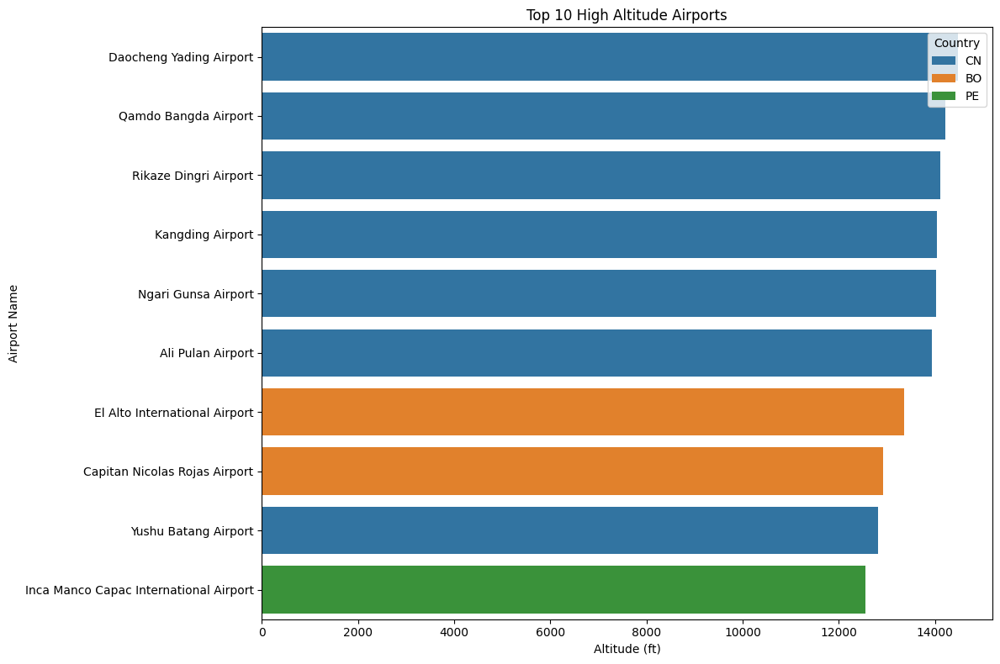

In [11]:
# Create barplot for altitude comparison
plt.figure(figsize=(12, 8))
sns.barplot(data=top_airports_data, y='Airport_Name', x='Elevation_Ft', hue='ISO_Country')
plt.xlabel('Altitude (ft)')
plt.ylabel('Airport Name')
plt.title('Top 10 High Altitude Airports')
plt.legend(title='Country', loc='upper right')
plt.tight_layout()
plt.show()

# Which airports have the most connections?

In [12]:
# Count the number of routes (connections) for each destination airport
connections_count = routes['destination_airport'].value_counts()

# Get top airports with the most connections
top_airports = connections_count.head(10) # Get top airports with the most connections
top_airports

# Filter airports dataset to include only top airports
top_airport_codes = top_airports.index.tolist()
top_airports_data = iata_airports[iata_airports['IATA'].isin(top_airport_codes)]
top_airports_data

,Airport_ID,Ident,Type,Airport_Name,Latitude,Longitude,Elevation_Ft,Continent,ISO_Country,ISO_Region,Municipality,Scheduled_Service,GPS_Code,IATA,Local_Code,Home_Link,Wikipedia_Link,Keywords
22575,2212,EDDF,large_airport,Frankfurt Airport,50.030241,8.561096,364.0,EU,DE,DE-HE,Frankfurt am Main,yes,EDDF,FRA,NaN,https://www.frankfurt-airport.de/,https://en.wikipedia.org/wiki/Frankfurt_Airport,"EDAF, Frankfurt am Main, Frankfurt Main, Rhein..."
23320,2434,EGLL,large_airport,London Heathrow Airport,51.470600,-0.461941,83.0,EU,GB,GB-ENG,London,yes,EGLL,LHR,NaN,http://www.heathrowairport.com/,https://en.wikipedia.org/wiki/Heathrow_Airport,"LON, Londres"
23512,2513,EHAM,large_airport,Amsterdam Airport Schiphol,52.308601,4.763890,-11.0,EU,NL,NL-NH,Amsterdam,yes,EHAM,AMS,NaN,https://www.schiphol.nl/,https://en.wikipedia.org/wiki/Amsterdam_Airpor...,NaN
37020,3384,KATL,large_airport,Hartsfield Jackson Atlanta International Airport,33.636700,-84.428101,1026.0,NaN,US,US-GA,Atlanta,yes,KATL,ATL,ATL,http://www.atlanta-airport.com/,https://en.wikipedia.org/wiki/Hartsfield–Jacks...,NaN
37462,3488,KDFW,large_airport,Dallas Fort Worth International Airport,32.896801,-97.038002,607.0,NaN,US,US-TX,Dallas-Fort Worth,yes,KDFW,DFW,DFW,https://www.dfwairport.com/,https://en.wikipedia.org/wiki/Dallas/Fort_Wort...,QDF
38594,3622,KJFK,large_airport,John F Kennedy International Airport,40.639447,-73.779317,13.0,NaN,US,US-NY,New York,yes,KJFK,JFK,JFK,https://www.jfkairport.com/,https://en.wikipedia.org/wiki/John_F._Kennedy_...,"Manhattan, New York City, NYC, Idlewild, IDL, ..."
38710,3632,KLAX,large_airport,Los Angeles International Airport,33.942501,-118.407997,125.0,NaN,US,US-CA,Los Angeles,yes,KLAX,LAX,LAX,https://www.flylax.com/,https://en.wikipedia.org/wiki/Los_Angeles_Inte...,Tom Bradley
39312,3754,KORD,large_airport,Chicago O'Hare International Airport,41.978600,-87.904800,680.0,NaN,US,US-IL,Chicago,yes,KORD,ORD,ORD,https://www.flychicago.com/ohare/home/pages/de...,https://en.wikipedia.org/wiki/O'Hare_Internati...,"CHI, Orchard Place"
42362,4185,LFPG,large_airport,Charles de Gaulle International Airport,49.012798,2.550000,392.0,EU,FR,FR-IDF,"Paris (Roissy-en-France, Val-d'Oise)",yes,LFPG,CDG,NaN,http://www.aeroportsdeparis.fr/,https://en.wikipedia.org/wiki/Charles_de_Gaull...,"PAR, Aéroport Roissy-Charles de Gaulle, Roissy..."
79537,27188,ZBAA,large_airport,Beijing Capital International Airport,40.080101,116.584999,116.0,AS,CN,CN-11,Beijing,yes,ZBAA,PEK,NaN,http://en.bcia.com.cn/,https://en.wikipedia.org/wiki/Beijing_Capital_...,"BJS, Bejing, Peking, Olympics"


In [13]:
from plotly.subplots import make_subplots

# Initialize figure with subplots
fig = make_subplots(
    rows=1, cols=2,
    column_widths=[0.7, 0.3],
    subplot_titles=("Flight Connections Map", "Top Airports with Most Connections"),
    specs=[[{"type": "scattergeo"}, {"type": "bar"}]]
)

# Add world map background without Choropleth
fig.add_trace(go.Scattergeo(
    lon=top_airports_data['Longitude'],
    lat=top_airports_data['Latitude'],
    text=top_airports_data['Airport_Name'],
    mode='markers',
    marker=dict(
        size=10,
        color='red',
        opacity=0.8,
        line=dict(width=0.5, color='black')
    ),
    name='Airports'
), row=1, col=1)


# Add subplot for countplot of top airports with most connections
sns.set(style="whitegrid")
count_plot_data = connections_count.head(10).reset_index()
count_plot_data.columns = ['Airport', 'Connections']

bar_trace = go.Bar(
    x=count_plot_data['Connections'],
    y=count_plot_data['Airport'],
    orientation='h',
    marker=dict(color='blue'),
    name='Connections Count'
)

fig.add_trace(bar_trace, row=1, col=2)

# Update layout
fig.update_layout(
    title='Flight Connections Map and Top Airports',
    geo=dict(
        showland=True,
        showcountries=True,
        showocean=True,
        countrycolor='white',
        landcolor='lightgray',
        oceancolor='lightblue',
        projection_type='natural earth'
    )
)

fig.update_yaxes(title_text="Airport", row=1, col=2)
fig.update_xaxes(title_text="Connections", row=1, col=2)

# Show the plot
fig.show()

# What are the busiest airline routes?

In [14]:
# Count the number of flights (connections) for each route
busiest_routes = routes.groupby(['source_airport', 'destination_airport']).size().reset_index(name='num_flights')

# Sort routes by the number of flights in descending order to find the busiest routes
busiest_routes = busiest_routes.sort_values(by='num_flights', ascending=False).head(10)
busiest_routes

,source_airport,destination_airport,num_flights
25184,ORD,ATL,20
2038,ATL,ORD,19
25296,ORD,MSY,13
14531,HKT,BKK,13
5581,CAN,HGH,12
22106,MIA,ATL,12
2217,AUH,MCT,12
2020,ATL,MIA,12
16634,JFK,LHR,12
14400,HKG,BKK,12


In [15]:
# Get the top 10 busiest airports
top_airports = set(busiest_routes['source_airport']).union(set(busiest_routes['destination_airport']))

# Filter airports data to include only the top 10 busiest airports
top_airports_data = iata_airports[iata_airports['IATA'].isin(top_airports)]
top_airports_data

,Airport_ID,Ident,Type,Airport_Name,Latitude,Longitude,Elevation_Ft,Continent,ISO_Country,ISO_Region,Municipality,Scheduled_Service,GPS_Code,IATA,Local_Code,Home_Link,Wikipedia_Link,Keywords
23320,2434,EGLL,large_airport,London Heathrow Airport,51.470600,-0.461941,83.0,EU,GB,GB-ENG,London,yes,EGLL,LHR,NaN,http://www.heathrowairport.com/,https://en.wikipedia.org/wiki/Heathrow_Airport,"LON, Londres"
37020,3384,KATL,large_airport,Hartsfield Jackson Atlanta International Airport,33.636700,-84.428101,1026.0,NaN,US,US-GA,Atlanta,yes,KATL,ATL,ATL,http://www.atlanta-airport.com/,https://en.wikipedia.org/wiki/Hartsfield–Jacks...,NaN
38594,3622,KJFK,large_airport,John F Kennedy International Airport,40.639447,-73.779317,13.0,NaN,US,US-NY,New York,yes,KJFK,JFK,JFK,https://www.jfkairport.com/,https://en.wikipedia.org/wiki/John_F._Kennedy_...,"Manhattan, New York City, NYC, Idlewild, IDL, ..."
38962,3685,KMIA,large_airport,Miami International Airport,25.793200,-80.290604,8.0,NaN,US,US-FL,Miami,yes,KMIA,MIA,MIA,http://www.miami-airport.com/,https://en.wikipedia.org/wiki/Miami_Internatio...,"MFW, South Florida"
39052,3711,KMSY,large_airport,Louis Armstrong New Orleans International Airport,29.993401,-90.258003,4.0,NaN,US,US-LA,New Orleans,yes,KMSY,MSY,MSY,https://flymsy.com/,https://en.wikipedia.org/wiki/Louis_Armstrong_...,NaN
39312,3754,KORD,large_airport,Chicago O'Hare International Airport,41.978600,-87.904800,680.0,NaN,US,US-IL,Chicago,yes,KORD,ORD,ORD,https://www.flychicago.com/ohare/home/pages/de...,https://en.wikipedia.org/wiki/O'Hare_Internati...,"CHI, Orchard Place"
50788,5226,OMAA,large_airport,Abu Dhabi International Airport,24.443764,54.651718,88.0,AS,AE,AE-AZ,Abu Dhabi,yes,OMAA,AUH,NaN,http://www.abudhabiairport.ae/,https://en.wikipedia.org/wiki/Abu_Dhabi_Intern...,NaN
50835,5242,OOMS,large_airport,Muscat International Airport,23.593300,58.284401,48.0,AS,OM,OM-MA,Muscat,yes,OOMS,MCT,NaN,https://www.muscatairport.co.om/,https://en.wikipedia.org/wiki/Seeb_Internation...,"Seeb International Airport, Masqat"
75392,26535,VHHH,large_airport,Hong Kong International Airport,22.308901,113.915001,28.0,AS,HK,HK-NT,Hong Kong,yes,VHHH,HKG,NaN,http://www.hongkongairport.com/,https://en.wikipedia.org/wiki/Hong_Kong_Intern...,"Chek Lap Kok Airport, 赤鱲角機場"
75761,28118,VTBS,large_airport,Suvarnabhumi Airport,13.681100,100.747002,5.0,AS,TH,TH-10,Bangkok,yes,VTBS,BKK,NaN,NaN,https://en.wikipedia.org/wiki/Suvarnabhumi_Air...,NaN


In [16]:
# Initialize the figure
fig = go.Figure()

# Define colors for each route based on its name (source to destination pair)
colors = ['blue', 'red', 'green', 'orange', 'purple', 'cyan', 'magenta', 'yellow', 'brown', 'pink']

# Add airport markers for the top 10 busiest airports
fig.add_trace(go.Scattergeo(
    lon=top_airports_data['Longitude'],
    lat=top_airports_data['Latitude'],
    text=top_airports_data['Airport_Name'],
    mode='markers',
    marker=dict(
        color='red',
        opacity=0.8,
        size=8
    ),
    name='Top 10 Busiest Airports'
))

# Add flight routes for the top busiest routes
for i, (_, row) in enumerate(busiest_routes.iterrows()):
    source_lat = iata_airports.loc[iata_airports['IATA'] == row['source_airport'], 'Latitude'].values[0]
    source_lon = iata_airports.loc[iata_airports['IATA'] == row['source_airport'], 'Longitude'].values[0]
    dest_lat = iata_airports.loc[iata_airports['IATA'] == row['destination_airport'], 'Latitude'].values[0]
    dest_lon = iata_airports.loc[iata_airports['IATA'] == row['destination_airport'], 'Longitude'].values[0]

    # Add flight route with source to destination text in legend and colored lines
    fig.add_trace(go.Scattergeo(
        lon=[source_lon, dest_lon],
        lat=[source_lat, dest_lat],
        mode='lines',
        line=dict(width=3, color=colors[i]),
        opacity=0.5,
        hoverinfo='text',
        text=f"{row['source_airport']} to {row['destination_airport']}<br>Flights: {row['num_flights']}",
        name=f"{row['source_airport']} to {row['destination_airport']}"  # Legend label
    ))

# Update layout
fig.update_layout(
    title='Top 10 Busiest Airline Routes with Top 10 Busiest Airports',
    geo=dict(
        showland=True,
        landcolor='rgb(217, 217, 217)',
        countrycolor='rgb(204, 204, 204)',
        oceancolor='lightsteelblue',
        showocean=True,
        resolution=110,
        showframe=False,
        showcoastlines=True,
        projection_type='orthographic'
    ),
    showlegend=True
)

# Show the plot
fig.show()

# Which countries have the most airports?

In [17]:
# Count the number of airports in each country
airports_per_country = iata_airports['ISO_Country'].value_counts().reset_index()
airports_per_country.columns = ['ISO_Country', 'Number_of_Airports']

# Merge with countries dataset to get country names
airports_per_country = airports_per_country.merge(countries[['code', 'Country']], left_on='ISO_Country', right_on='code', how='left')

# Get the top 10 countries with the most airports
top_countries = airports_per_country.head(20)
top_countries[['Country', 'Number_of_Airports']]
top_countries

,ISO_Country,Number_of_Airports,code,Country
0,US,2040,US,United States
1,AU,614,AU,Australia
2,CA,477,CA,Canada
3,BR,348,BR,Brazil
4,PG,342,PG,Papua New Guinea
5,CN,309,CN,China
6,ID,239,ID,Indonesia
7,RU,220,RU,Russia
8,CO,158,CO,Colombia
9,IN,158,IN,India


/var/folders/zc/zmsjc2n90lg57tm5x4g9t1rw0000gn/T/ipykernel_1687/2774642512.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




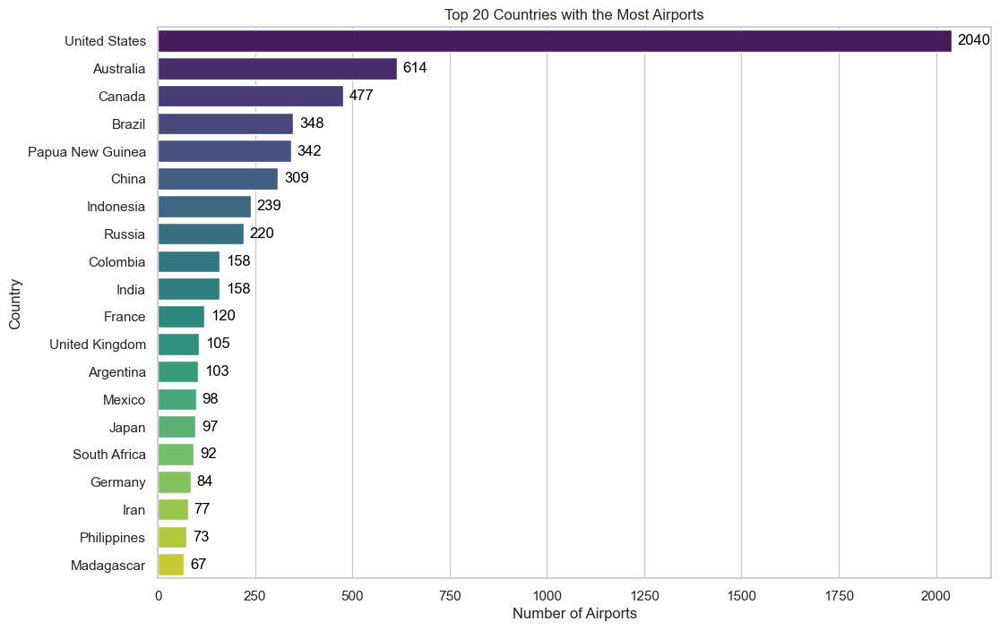

In [18]:
# Create a figure and axis
plt.figure(figsize=(12, 8))

# Create the bar plot using Seaborn
ax = sns.barplot(data=top_countries, y='Country', x='Number_of_Airports', palette='viridis')

# Add annotations (numbers) on top of each bar
for p in ax.patches:
    ax.annotate(f'{p.get_width():.0f}', 
                (p.get_width(), p.get_y() + p.get_height() / 2), 
                ha='left', va='center', fontsize=12, color='black', xytext=(5, 0), 
                textcoords='offset points')

# Set labels and title
plt.xlabel('Number of Airports')
plt.ylabel('Country')
plt.title('Top 20 Countries with the Most Airports')

# Show plot
plt.show()

In [19]:
import plotly.express as px

# Sort top_countries by Number_of_Airports for proper treemap hierarchy
airports_per_country = airports_per_country.sort_values(by='Number_of_Airports', ascending=False)

# Create treemap plot using plotly.express
fig = px.treemap(airports_per_country, 
                 path=['Country'],  
                 values='Number_of_Airports', 
                 title='Top Countries with the Most Airports',
                 color='Number_of_Airports',  
                 color_continuous_scale='Viridis' 
                )

# Update layout
fig.update_layout(
    margin=dict(t=50, l=10, r=10, b=10),  
)

# Show plot
fig.show()


# Which airlines operate the most routes?

In [20]:
airlines = pd.read_csv("airlines.csv")
airlines.columns = airlines.columns.str.lower().str.replace(" ", "_")
airlines

,airline_id,name,alias,iata,icao,callsign,country,active
0,-1,Unknown,\N,-,NaN,\N,\N,Y
1,1,Private flight,\N,-,NaN,NaN,NaN,Y
2,2,135 Airways,\N,NaN,GNL,GENERAL,United States,N
3,3,1Time Airline,\N,1T,RNX,NEXTIME,South Africa,Y
4,4,2 Sqn No 1 Elementary Flying Training School,\N,NaN,WYT,NaN,United Kingdom,N
...,...,...,...,...,...,...,...,...
6157,21248,GX Airlines,NaN,NaN,CBG,SPRAY,China,Y
6158,21251,Lynx Aviation (L3/SSX),NaN,NaN,SSX,Shasta,United States,N
6159,21268,Jetgo Australia,NaN,JG,\N,NaN,Australia,Y
6160,21270,Air Carnival,NaN,2S,\N,NaN,India,Y


In [21]:
# Count the number of routes operated by each airline
airlines_route_count = routes['airline'].value_counts().reset_index()
airlines_route_count.columns = ['iata', 'number_of_routes']

# Get the top 10 airlines with the most routes
top_airlines = airlines_route_count.head(20)

# Merge with airlines dataset to get airline names
top_airlines = top_airlines.merge(airlines[['iata', 'name']], on='iata', how='left')
top_airlines


,iata,number_of_routes,name
0,FR,2478,Ryanair
1,AA,2350,American Airlines
2,UA,2175,United Airlines
3,DL,1979,Delta Air Lines
4,US,1960,US Airways
5,CZ,1452,China Southern Airlines
6,MU,1259,China Eastern Airlines
7,CA,1259,Air China
8,WN,1146,Southwest Airlines
9,U2,1092,easyJet


/var/folders/zc/zmsjc2n90lg57tm5x4g9t1rw0000gn/T/ipykernel_1687/861740394.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




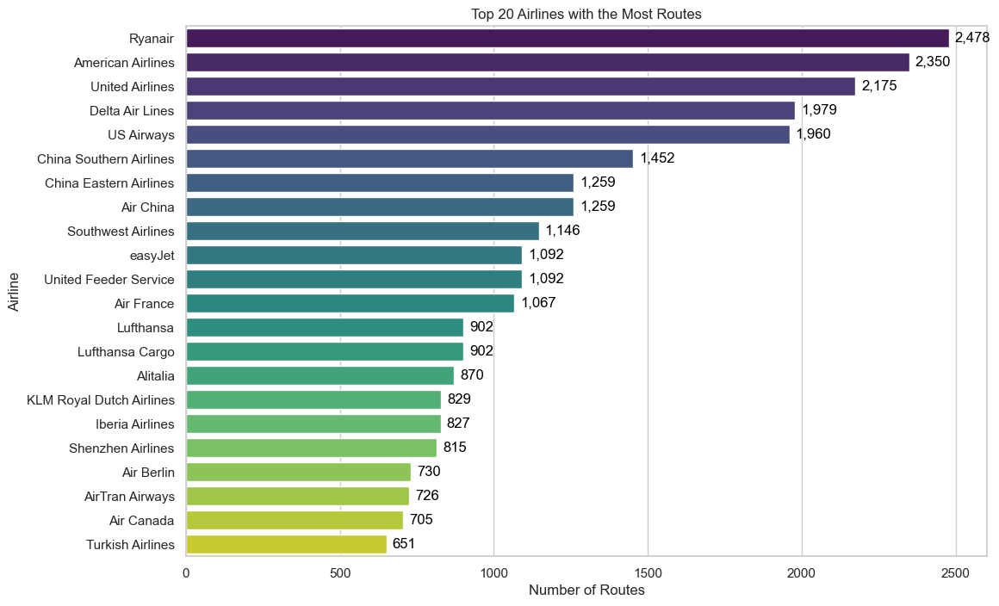

In [22]:
# Create a bar plot using Seaborn
plt.figure(figsize=(12, 8))

# Create the bar plot using Seaborn
ax = sns.barplot(data=top_airlines, y='name', x='number_of_routes', palette='viridis')

# Add annotations (numbers) on top of each bar
for p in ax.patches:
    ax.annotate(f'{int(p.get_width()):,}', 
                (p.get_width(), p.get_y() + p.get_height() / 2), 
                ha='left', va='center', fontsize=12, color='black', xytext=(5, 0), 
                textcoords='offset points')

# Set labels and title
plt.xlabel('Number of Routes')
plt.ylabel('Airline')
plt.title('Top 20 Airlines with the Most Routes')

# Show plot
plt.show()

In [23]:
iata_airports.columns

Index(['Airport_ID', 'Ident', 'Type', 'Airport_Name', 'Latitude', 'Longitude',
       'Elevation_Ft', 'Continent', 'ISO_Country', 'ISO_Region',
       'Municipality', 'Scheduled_Service', 'GPS_Code', 'IATA', 'Local_Code',
       'Home_Link', 'Wikipedia_Link', 'Keywords'],
      dtype='object')

In [24]:
routes.columns

Index(['airline', 'airline_id', 'source_airport', 'source_airport_id',
       'destination_airport', 'destination_airport_id', 'codeshare', 'stops',
       'equipment', 'Airport_Name', 'IATA', 'Latitude', 'Longitude'],
      dtype='object')

In [25]:
countries.columns

Index(['id', 'code', 'Country', 'continent', 'wikipedia_link', 'keywords'], dtype='object')

In [26]:
airlines.columns

Index(['airline_id', 'name', 'alias', 'iata', 'icao', 'callsign', 'country',
       'active'],
      dtype='object')

In [28]:
# Read airports data
countries_of_the_world = pd.read_csv("countries of the world.csv")
countries_of_the_world.columns

Index(['Country', 'Region', 'Population', 'Area (sq. mi.)',
       'Pop. Density (per sq. mi.)', 'Coastline (coast/area ratio)',
       'Net migration', 'Infant mortality (per 1000 births)',
       'GDP ($ per capita)', 'Literacy (%)', 'Phones (per 1000)', 'Arable (%)',
       'Crops (%)', 'Other (%)', 'Climate', 'Birthrate', 'Deathrate',
       'Agriculture', 'Industry', 'Service'],
      dtype='object')

# What is the correlation bet. a country's population and the number of airports it has?

In [35]:
# Standardize country names by stripping whitespace
countries_of_the_world['Country'] = countries_of_the_world['Country'].str.strip()
countries['Country'] = countries['Country'].str.strip()
airports_per_country['Country'] = airports_per_country['Country'].str.strip()

# Merge the datasets on the 'Country' column
merged_data = pd.merge(countries_of_the_world, countries, on='Country', how='inner')

# Merge the resulting merged_data with the airports_per_country dataset on the 'Country' column
final_merged_data = pd.merge(merged_data, airports_per_country, on='Country', how='inner')
final_merged_data

,Country,Region,Population,Area (sq. mi.),Pop. Density (per sq. mi.),Coastline (coast/area ratio),Net migration,Infant mortality (per 1000 births),GDP ($ per capita),Literacy (%),...,Industry,Service,id,code_x,continent,wikipedia_link,keywords,ISO_Country,Number_of_Airports,code_y
0,Afghanistan,ASIA (EX. NEAR EAST),31056997,647500,"48,0","0,00","23,06","163,07",700.0,"36,0",...,"0,24","0,38",302619,AF,AS,https://en.wikipedia.org/wiki/Afghanistan,NaN,AF,33,AF
1,Albania,EASTERN EUROPE,3581655,28748,"124,6","1,26","-4,93","21,52",4500.0,"86,5",...,"0,188","0,579",302673,AL,EU,https://en.wikipedia.org/wiki/Albania,Albanian airports,AL,2,AL
2,Algeria,NORTHERN AFRICA,32930091,2381740,"13,8","0,04","-0,39",31,6000.0,"70,0",...,"0,6","0,298",302568,DZ,AF,https://en.wikipedia.org/wiki/Algeria,مطارات الجزائر,DZ,42,DZ
3,American Samoa,OCEANIA,57794,199,"290,4","58,29","-20,71","9,27",8000.0,"97,0",...,NaN,NaN,302763,AS,OC,https://en.wikipedia.org/wiki/American_Samoa,Samoan airports,AS,3,AS
4,Angola,SUB-SAHARAN AFRICA,12127071,1246700,"9,7","0,13",0,"191,19",1900.0,"42,0",...,"0,658","0,246",302556,AO,AF,https://en.wikipedia.org/wiki/Angola,Angolan airports,AO,43,AO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
190,Wallis and Futuna,OCEANIA,16025,274,"58,5","47,08",NaN,NaN,3700.0,"50,0",...,NaN,NaN,302787,WF,OC,https://en.wikipedia.org/wiki/Wallis_and_Futuna,Airports in Wallis and Futuna,WF,2,WF
191,Western Sahara,NORTHERN AFRICA,273008,266000,"1,0","0,42",NaN,NaN,NaN,NaN,...,NaN,"0,4",302570,EH,AF,https://en.wikipedia.org/wiki/Western_Sahara,"Sahrawian, مطارات الصحراء الغربية",EH,3,EH
192,Yemen,NEAR EAST,21456188,527970,"40,6","0,36",0,"61,5",800.0,"50,2",...,"0,472","0,393",302671,YE,AS,https://en.wikipedia.org/wiki/Yemen,مطارات اليمن,YE,22,YE
193,Zambia,SUB-SAHARAN AFRICA,11502010,752614,"15,3","0,00",0,"88,29",800.0,"80,6",...,"0,29","0,489",302611,ZM,AF,https://en.wikipedia.org/wiki/Zambia,Zambian airports,ZM,23,ZM


In [48]:
# Ensure Population is numeric
final_merged_data['Population'] = pd.to_numeric(final_merged_data['Population'], errors='coerce')

# Drop rows with NaN values in Population or Number_of_Airports
final_merged_data = final_merged_data.dropna(subset=['Population', 'Number_of_Airports'])

# Check data types
final_merged_data[['Population', 'Number_of_Airports']].dtypes

# Calculate the correlation
correlation = final_merged_data['Population'].corr(final_merged_data['Number_of_Airports'])

# Plotting the data
fig = px.scatter(final_merged_data, x='Population', y='Number_of_Airports', color='Country', hover_name='Country',
                 title='Correlation between Population and Number of Airports by Country',
                 labels={'Population': 'Population', 'Number_of_Airports': 'Number of Airports'})

fig.update_layout(title='Correlation between Population and Number of Airports by Country',
                  xaxis_title='Population',
                  yaxis_title='Number of Airports')

fig.show()